## Train model for all subjects

In [1]:
model_name = 'DWTs'

### Import libraries

In [2]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, OneHotEncoder

from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.feature_selection import mutual_info_classif


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, log_loss
from sklearn.model_selection import cross_validate

from matplotlib.colors import LinearSegmentedColormap
from mne import create_info
from mne.viz import plot_topomap

### Import data

In [3]:
filename = '/mnt/d/sharegit/MasterThesis_data/'+ model_name +'/pp01_t16.csv'
df = pd.read_csv(filename, header=None)

### Prepare Data

In [4]:
df.replace([np.inf, -np.inf], np.nan, inplace=True)

channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
patterns = ['_d1', '_d2', '_d3', '_d4', '_d5', '_a1']
column_names = ['channels', 'ID', 'Class', 'Epoch'] + [f'{ch}{pt}' for ch in channels for pt in patterns]

if len(column_names) != len(df.columns):
    raise ValueError(f"Number of column names ({len(column_names)}) does not match number of columns in DataFrame ({len(df.columns)})")

df.columns = column_names
df.head()

,channels,ID,Class,Epoch,Fp1_d1,Fp1_d2,Fp1_d3,Fp1_d4,Fp1_d5,Fp1_a1,...,CPz_d3,CPz_d4,CPz_d5,CPz_a1,POz_d1,POz_d2,POz_d3,POz_d4,POz_d5,POz_a1
0,5,1,1,1,0.575075,0.136032,0.123487,0.093560,0.057901,0.013945,...,0.140594,0.042888,0.025799,0.006609,0.336483,0.220715,0.231677,0.101612,0.089528,0.019985
1,5,1,1,2,0.509184,0.262941,0.106593,0.072962,0.037227,0.011093,...,0.163608,0.041396,0.009745,0.001428,0.244889,0.384025,0.221724,0.070184,0.060243,0.018934
2,5,1,1,3,0.490340,0.191802,0.204283,0.070682,0.033491,0.009402,...,0.218914,0.044268,0.010597,0.001778,0.273779,0.215197,0.395480,0.070791,0.033080,0.011673
3,5,1,1,4,0.436777,0.235945,0.218578,0.060795,0.038248,0.009657,...,0.273868,0.036003,0.010619,0.001746,0.369812,0.265958,0.274095,0.053359,0.028603,0.008174
4,5,1,1,5,0.398432,0.307515,0.197477,0.053886,0.033593,0.009097,...,0.303220,0.038299,0.007286,0.001249,0.214284,0.327662,0.322558,0.071483,0.049477,0.014537


### Load data into data_array

In [5]:
def load_IDs(df, IDs,types,mod):
    df = df[df['Class'].isin(types)]
    
    class_mapping = dict(zip(types, mod))
    df['Class'] = df['Class'].map(class_mapping)
    
    # Filter the dataframe for the provided IDs
    df = df[df['ID'].isin(IDs)]
    
    # Drop unnecessary columns
    df = df.drop(columns=['channels', 'ID', 'Epoch'])
    
    # Prepare data and labels
    data_array = df.drop(['Class'], axis=1).values
    class_labels = df['Class'].values
    
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(data_array, class_labels, test_size=0.2, random_state=42)
    print(df.shape[0])
    return X_train, X_test, y_train, y_test
    
# Example usage
types = [1,2,3,4]
mod = ['I1','I2','I3','I4']
IDs = range(1, 35)
X_train, X_test, y_train, y_test = load_IDs(df, IDs,types,mod)

2230


/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)


In [6]:
print(set(IDs))

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34}


### Train models

In [7]:
def print_scores(name, scores):
    mean_test_accuracy = np.mean(scores['test_accuracy']) * 100
    std_test_accuracy = np.std(scores['test_accuracy']) * 100
    mean_test_precision = np.mean(scores['test_precision_macro'])
    mean_test_recall = np.mean(scores['test_recall_macro'])
    mean_test_f1 = np.mean(scores['test_f1_macro'])
    mean_test_roc_auc = np.mean(scores['test_roc_auc_ovr'])
    
    print(f"------------------------------------------------------------")
    print(f"Average K-Fold Test Accuracy of {name}: {mean_test_accuracy:.2f}%")
    print(f"Std Dev of K-Fold Test Accuracy of {name}: {std_test_accuracy:.2f}%")
    print(f"Average K-Fold Test Precision of {name}: {mean_test_precision:.2f}")
    print(f"Average K-Fold Test Recall of {name}: {mean_test_recall:.2f}")
    print(f"Average K-Fold Test F1 Score of {name}: {mean_test_f1:.2f}")
    print(f"Average K-Fold Test ROC AUC of {name}: {mean_test_roc_auc:.2f}")
    print(f"------------------------------------------------------------")
    
def RForest_train(X_train, y_train, n_estimators=100, max_depth=None, min_samples_split=2, min_samples_leaf=1, max_features='sqrt', validation='standard', cv=5, echo=True):
    model = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth,
                                      min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,
                                      max_features=max_features, random_state=42)
    
    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr']
    scores = cross_validate(model, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)

    model.fit(X_train, y_train)
    
    if echo:
        print_scores('Random Forest', scores)
    return scores, model


def KNN_train(X_train, y_train, hot_encode=False, n_neighbors=20, p=1, weights='distance', leaf_size=20, algorithm='auto', validation='standard', cv=5, echo=True):
    model = KNeighborsClassifier(n_neighbors=n_neighbors, p=p, weights=weights, leaf_size=leaf_size, algorithm=algorithm)

    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr']
    scores = cross_validate(model, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)
    
    model.fit(X_train, y_train)
    
    if echo:
        print_scores('KNN', scores)
    return scores, model


def MLP_train(X_train, y_train,  hot_encode=False, hidden_layer_sizes=(100,), activation='relu', solver='adam', validation='standard', alpha=0.001, cv=5, max_iter=200, echo=True):
    model = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, activation=activation, solver=solver, alpha=alpha, batch_size='auto', learning_rate='constant', 
                              learning_rate_init=0.001, power_t=0.5, max_iter=max_iter, shuffle=True, random_state=None, tol=0.0001, verbose=False, 
                              warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, 
                              beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)

    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr']
    scores = cross_validate(model,X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)
    
    model.fit(X_train, y_train)

    if echo:
        print_scores('MLP', scores)
    return scores, model

def train_all(X_train, y_train):

    models = []
    scores = []
    
    score, model = KNN_train(X_train, y_train, cv = 5)
    models.append(model)
    scores.append(score)
    
    score, model =RForest_train(X_train, y_train,  cv = 5)
    models.append(model)
    scores.append(score)
    
    score, model = MLP_train(X_train, y_train, hidden_layer_sizes=(200, 100, 50), max_iter=10000, alpha=0.001, cv=5)
    models.append(model)
    scores.append(score)
    
    return models, scores

models,scores = train_all(X_train, y_train)

------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 31.11%
Std Dev of K-Fold Test Accuracy of KNN: 1.88%
Average K-Fold Test Precision of KNN: 0.31
Average K-Fold Test Recall of KNN: 0.31
Average K-Fold Test F1 Score of KNN: 0.31
Average K-Fold Test ROC AUC of KNN: 0.59
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 42.60%
Std Dev of K-Fold Test Accuracy of Random Forest: 2.15%
Average K-Fold Test Precision of Random Forest: 0.43
Average K-Fold Test Recall of Random Forest: 0.43
Average K-Fold Test F1 Score of Random Forest: 0.42
Average K-Fold Test ROC AUC of Random Forest: 0.69
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 40.53%
Std Dev of K-Fold Test Accuracy of MLP: 1.74%
Average K-Fold Test Precision of 

In [8]:
from sklearn.preprocessing import LabelEncoder
from scipy.stats import mode

def calculate_acc(y_test_encoded, models):
    ensemble_preds = np.zeros((len(y_test_encoded), len(models)))
    accs = []
    # Loop over each model to get predictions and calculate individual accuracies
    for i, (model, name) in enumerate(zip(models, ['KNN', 'Random Forest','MLP'])):
        pred = model.predict(X_test)
        
        # Convert string predictions to numerical form
        pred_encoded = le.transform(pred)
        
        acc = np.mean(pred_encoded == y_test_encoded)
        accs.append(acc)
        print(f"{name} Classification Accuracy: {acc}")
        
        # Store the numerical predictions for ensemble averaging
        ensemble_preds[:, i] = pred_encoded

    # Average the predictions (using mode here for classification)
    ensemble_final_preds_encoded = mode(ensemble_preds, axis=1)[0].flatten()
    
    # Convert numerical predictions back to string labels
    ensemble_final_preds = le.inverse_transform(ensemble_final_preds_encoded.astype(int))
    
    # Calculate the ensemble accuracy
    ensemble_acc = np.mean(ensemble_final_preds == y_test)
    print(f"Ensemble Classification Accuracy: {ensemble_acc}")
    return accs, ensemble_preds
le = LabelEncoder()
y_test_encoded = le.fit_transform(y_test)
accs,ensemble_preds = calculate_acc(y_test_encoded, models)

KNN Classification Accuracy: 0.35874439461883406
Random Forest Classification Accuracy: 0.3923766816143498
MLP Classification Accuracy: 0.4013452914798206
Ensemble Classification Accuracy: 0.3968609865470852


In [9]:
print(accs[1])

0.3923766816143498


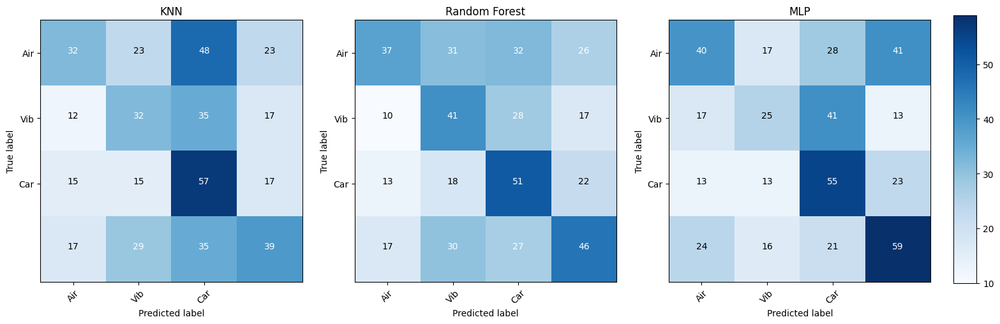

In [10]:
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns  # For enhanced confusion matrix visualization

def plot_confusion_matrix(ax, cm, classes, title, vmin, vmax):
    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues, vmin=vmin, vmax=vmax)
    ax.set_title(title)
    tick_marks = range(len(classes))
    ax.set_xticks(tick_marks)
    ax.set_xticklabels(classes, rotation=45)
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, format(cm[i, j], fmt),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

    ax.set_ylabel('True label')
    ax.set_xlabel('Predicted label')

def plot_all_cm(y_test_encoded, ensemble_preds, names):
    # Compute confusion matrices
    cm_knn = confusion_matrix(y_test_encoded, ensemble_preds[:, 0])
    cm_rf = confusion_matrix(y_test_encoded, ensemble_preds[:, 1])
    cm_mlp = confusion_matrix(y_test_encoded, ensemble_preds[:, 2])
    
    # Find the global vmin and vmax for all confusion matrices
    all_cms = [cm_knn, cm_rf, cm_mlp]
    vmin = min(cm.min() for cm in all_cms)
    vmax = max(cm.max() for cm in all_cms)
    
    # Create subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Plot each confusion matrix with shared vmin and vmax
    plot_confusion_matrix(axes[0], cm_knn, names, 'KNN', vmin, vmax)
    plot_confusion_matrix(axes[1], cm_rf, names, 'Random Forest', vmin, vmax)
    plot_confusion_matrix(axes[2], cm_mlp, names, 'MLP', vmin, vmax)
    
    # Create a single color bar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    plt.colorbar(axes[0].images[0], cax=cbar_ax)
    plt.show()
names = ['Air','Vib','Car']
plot_all_cm(y_test_encoded, ensemble_preds, names)


## Features Selection

### Colormap and functions definition

In [11]:
import seaborn as sns
import os
# Define the custom colormap
cdict = {
    'red':   [(0.0, 0.0, 0.0),
              (0.33, 0.0, 0.0),
              (0.66, 1.0, 1.0),
              (1.0, 1.0, 1.0)],
    'green': [(0.0, 0.3, 0.3),  # Start with a slight green to make the blue lighter
              (0.33, 1.0, 1.0),
              (0.66, 1.0, 1.0),
              (1.0, 0.0, 0.0)],
    'blue':  [(0.0, 0.9, 0.9),  # Ensure the blue starts at full intensity but is mixed with green
              (0.33, 1.0, 1.0),
              (0.66, 0.0, 0.0),
              (1.0, 0.0, 0.0)]
}

custom_cmap = LinearSegmentedColormap('CustomJet', segmentdata=cdict, N=256)

def get_mutualInfo(X_train, y_train):
    mutual_info_scores = mutual_info_classif(X_train, y_train)
    selected_features = np.where(mutual_info_scores > 0)[0]
    
    X_train_sf = X_train[:, selected_features]
    X_test_sf = X_test[:, selected_features]

    channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
    patterns = ['d1', 'd2', 'd3', 'd4', 'd5', 'a1']
    feature_names = [f'{ch}_{pt}' for ch in channels for pt in patterns]
    
    scores_matrix = mutual_info_scores.reshape(len(channels), len(patterns))
    
    #print(f"Number of features selected: {len(selected_features)}")
    return scores_matrix,X_train_sf,X_test_sf
    
def plot_matrix_MI(X_train, y_train, custom_cmap, save = False, model_name = '',fig_name= ''):
    channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
    patterns = ['d1', 'd2', 'd3', 'd4', 'd5', 'a1']
    feature_names = [f'{ch}_{pt}' for ch in channels for pt in patterns]
    
    scores_matrix,X_train_sf,X_test_sf = get_mutualInfo(X_train, y_train)
    scores_df = pd.DataFrame(scores_matrix, index=channels, columns=patterns)
    plt.figure(figsize=(10, 8))
    sns.heatmap(scores_df, annot=True, fmt=".3f", cmap=custom_cmap)
    plt.title('Heatmap of Mutual Information Scores')
    plt.xlabel('Patterns')
    plt.ylabel('Channels')
    plt.show()
    if save:
        plt.savefig(f'/mnt/d/sharegit/MasterThesis_data/{model_name}/{fig_name}.png')
    
def plot_topoplot(X_train, y_train, info,custom_cmap,save = False, model_name = '',fig_name= ''):

    channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
    patterns = ['d1', 'd2', 'd3', 'd4', 'd5', 'a1']
    feature_names = [f'{ch}_{pt}' for ch in channels for pt in patterns]

    scores_matrix,X_train_sf,X_test_sf = get_mutualInfo(X_train, y_train)
    vmin, vmax = 0, np.max(scores_matrix)*1.1   
    fig, axes = plt.subplots(1, 6, figsize=(18, 10))  # Adjusting the figsize for better visualization
    for i, pattern in enumerate(patterns):
        data = scores_matrix[:, i]
        im, _ = plot_topomap(data, info, axes=axes[i], show=False, cmap=custom_cmap, names=channels, vlim=(vmin, vmax))
        axes[i].set_title(f'{pattern}')
    
    # Adding colorbar
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.02, pad=0.04)
    cbar.set_label('Mutual information (bits)')
    
    if save:
        save_path = f'/mnt/d/sharegit/MasterThesis_data/{model_name}'
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.savefig(os.path.join(save_path, f'{fig_name}.png'))
    
    plt.show()  # Show the plot after saving
 

### Plot Matrix Mutual information

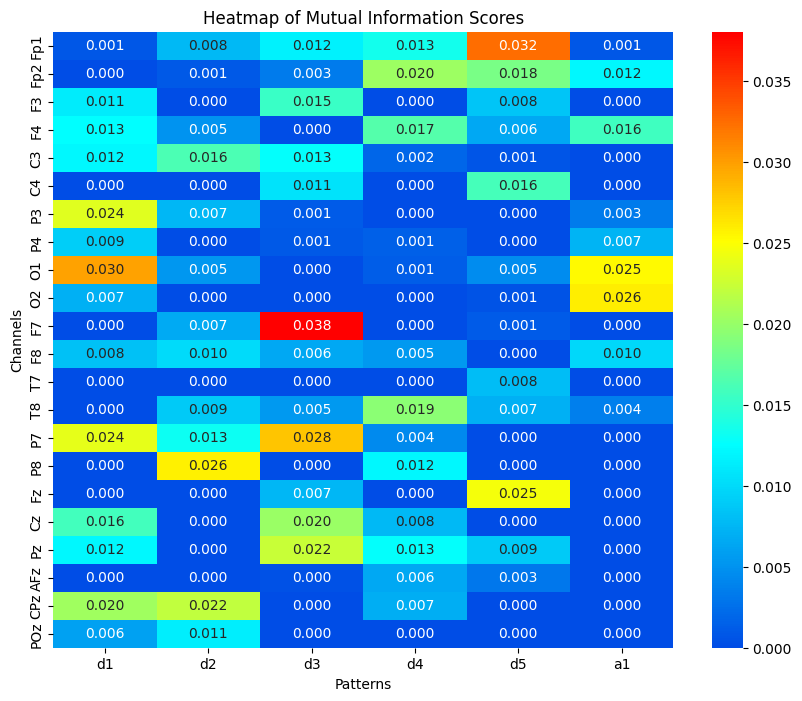

<Figure size 640x480 with 0 Axes>

In [12]:
plot_matrix_MI(X_train, y_train, custom_cmap,save = True, model_name = model_name, fig_name = 'all_subs_confmat')

### Plot as channel location 

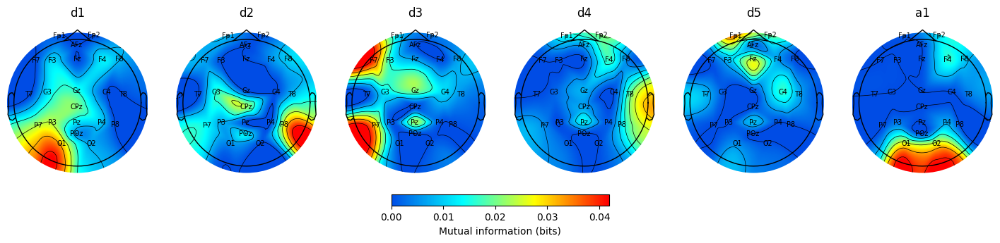

In [13]:
# Load theta and phi values from the provided image
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']

# Create info structure
info = create_info(channels, sfreq=250, ch_types='eeg')
info.set_montage(montage = "standard_1020",match_alias = True)

plot_topoplot(X_train, y_train, info, custom_cmap,save = True,  model_name = model_name, fig_name = 'all_subs_topoplot')


## Summarized analysis

### Initialize parameters

In [14]:
# Initialize the LabelEncoder
le = LabelEncoder()

# Create info structure
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
info = create_info(channels, sfreq=250, ch_types='eeg')
info.set_montage(montage="standard_1020", match_alias=True)

# Initialize the DataFrame list for storing results
df_ids_list = []

### Train models for each subjects

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:1000: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_scorer.py", line 139, in __call__
    score = scorer.

27
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: nan%
Std Dev of K-Fold Test Accuracy of KNN: nan%
Average K-Fold Test Precision of KNN: nan
Average K-Fold Test Recall of KNN: nan
Average K-Fold Test F1 Score of KNN: nan
Average K-Fold Test ROC AUC of KNN: nan
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/model_selection/_valida

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 61.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 13.56%
Average K-Fold Test Precision of Random Forest: 0.36
Average K-Fold Test Recall of Random Forest: 0.53
Average K-Fold Test F1 Score of Random Forest: 0.42
Average K-Fold Test ROC AUC of Random Forest: nan
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:1000: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lkcepza/anaconda3/envs/tf_test/lib/python3.

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 42.00%
Std Dev of K-Fold Test Accuracy of MLP: 14.35%
Average K-Fold Test Precision of MLP: 0.22
Average K-Fold Test Recall of MLP: 0.40
Average K-Fold Test F1 Score of MLP: 0.28
Average K-Fold Test ROC AUC of MLP: nan
------------------------------------------------------------


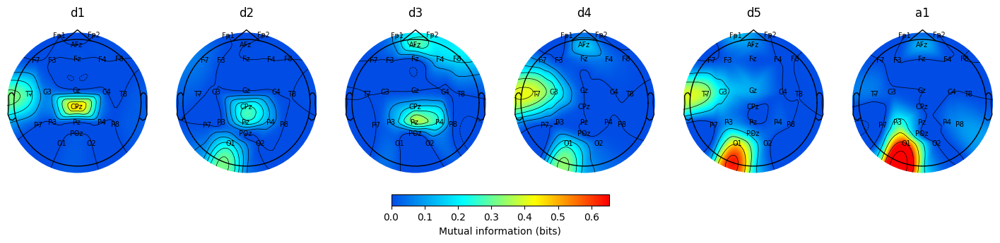

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 31.27%
Std Dev of K-Fold Test Accuracy of KNN: 6.65%
Average K-Fold Test Precision of KNN: 0.36
Average K-Fold Test Recall of KNN: 0.34
Average K-Fold Test F1 Score of KNN: 0.33
Average K-Fold Test ROC AUC of KNN: 0.67
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 48.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 9.93%
Average K-Fold Test Precision of Random Forest: 0.53
Average K-Fold Test Recall of Random Forest: 0.50
Average K-Fold Test F1 Score of Random Forest: 0.49
Average K-Fold Test ROC AUC of Random Forest: 0.75
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 46.55%
Std Dev of K-Fold Test Accuracy of MLP: 16.00%
Average K-Fold Test Precision of MLP: 0.55
Average K-Fold Test Recall of MLP: 0.48
Average K-Fold Test F1 Score of MLP: 0.50
Average K-Fold Test ROC AUC of MLP: 0.71
------------------------------------------------------------
KNN Classification Accuracy: 0.6428571428571429
Random Forest Classification Accuracy: 0.5714285714285714
MLP Classification Accuracy: 0.42857142857142855
Ensemble Classification Accuracy: 0.5714285714285714


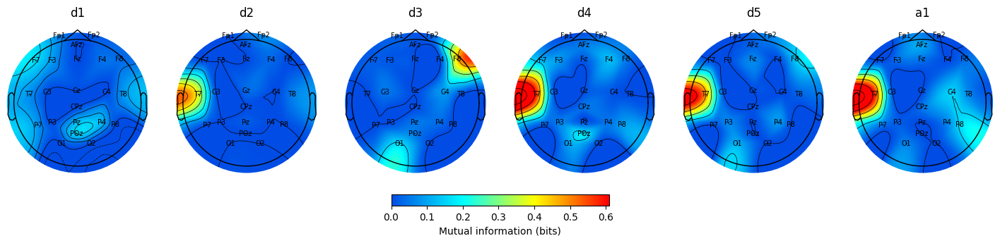

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 44.55%
Std Dev of K-Fold Test Accuracy of KNN: 7.27%
Average K-Fold Test Precision of KNN: 0.38
Average K-Fold Test Recall of KNN: 0.42
Average K-Fold Test F1 Score of KNN: 0.38
Average K-Fold Test ROC AUC of KNN: 0.67
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 59.27%
Std Dev of K-Fold Test Accuracy of Random Forest: 7.05%
Average K-Fold Test Precision of Random Forest: 0.60
Average K-Fold Test Recall of Random Forest: 0.58
Average K-Fold Test F1 Score of Random Forest: 0.58
Average K-Fold Test ROC AUC of Random Forest: 0.82
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 52.18%
Std Dev of K-Fold Test Accuracy of MLP: 12.57%
Average K-Fold Test Precision

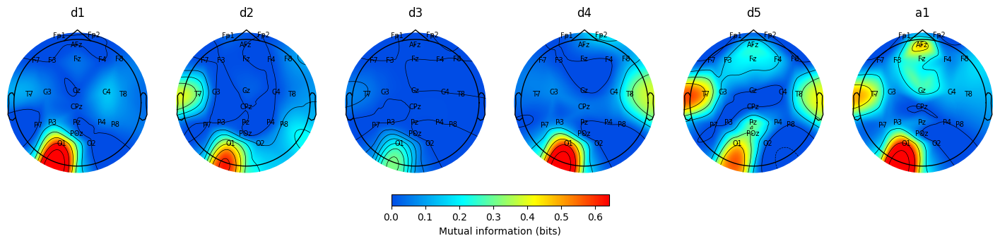

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 25.82%
Std Dev of K-Fold Test Accuracy of KNN: 15.49%
Average K-Fold Test Precision of KNN: 0.23
Average K-Fold Test Recall of KNN: 0.26
Average K-Fold Test F1 Score of KNN: 0.23
Average K-Fold Test ROC AUC of KNN: 0.67
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 73.82%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.02%
Average K-Fold Test Precision of Random Forest: 0.75
Average K-Fold Test Recall of Random Forest: 0.76
Average K-Fold Test F1 Score of Random Forest: 0.74
Average K-Fold Test ROC AUC of Random Forest: 0.92
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 59.27%
Std Dev of K-Fold Test Accuracy of MLP: 16.77%
Average K-Fold Test Precision of MLP: 0.61
Average K-Fold Test Recall of MLP: 0.60
Average K-Fold Test F1 Score of MLP: 0.58
Average K-Fold Test ROC AUC of MLP: 0.78
------------------------------------------------------------
KNN Classification Accuracy: 0.21428571428571427
Random Forest Classification Accuracy: 0.7857142857142857
MLP Classification Accuracy: 0.5714285714285714
Ensemble Classification Acc

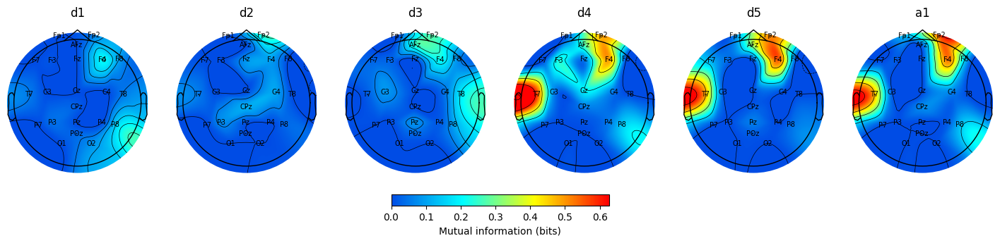

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


63
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 58.00%
Std Dev of K-Fold Test Accuracy of KNN: 14.70%
Average K-Fold Test Precision of KNN: 0.64
Average K-Fold Test Recall of KNN: 0.61
Average K-Fold Test F1 Score of KNN: 0.57
Average K-Fold Test ROC AUC of KNN: 0.82
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 90.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 6.32%
Average K-Fold Test Precision of Random Forest: 0.94
Average K-Fold Test Recall of Random Forest: 0.88
Average K-Fold Test F1 Score of Random Forest: 0.89
Average K-Fold Test ROC AUC of Random Forest: 0.97
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 76.00%
Std Dev of K-Fold Test Accuracy of MLP: 4.90%
Average K-Fold Test Precision of MLP: 0.78
Average K-Fold Test Recall of MLP: 0.76
Average K-Fold Test F1 Score of MLP: 0.73
Average K-Fold Test ROC AUC of MLP: 0.95
------------------------------------------------------------
KNN Classification Accuracy: 0.6153846153846154
Random Forest Classification Accuracy: 0.9230769230769231
MLP Classification Accuracy: 0.6923076923076923
Ensemble Classification Accuracy: 0.8461538461538461


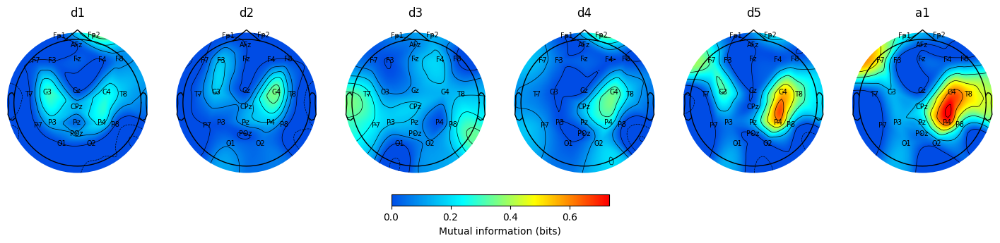

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 31.45%
Std Dev of K-Fold Test Accuracy of KNN: 7.08%
Average K-Fold Test Precision of KNN: 0.28
Average K-Fold Test Recall of KNN: 0.32
Average K-Fold Test F1 Score of KNN: 0.27
Average K-Fold Test ROC AUC of KNN: 0.53
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 42.73%
Std Dev of K-Fold Test Accuracy of Random Forest: 13.97%
Average K-Fold Test Precision of Random Forest: 0.41
Average K-Fold Test Recall of Random Forest: 0.42
Average K-Fold Test F1 Score of Random Forest: 0.40
Average K-Fold Test ROC AUC of Random Forest: 0.79
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 46.18%
Std Dev of K-Fold Test Accuracy of MLP: 13.68%
Average K-Fold Test Precisio

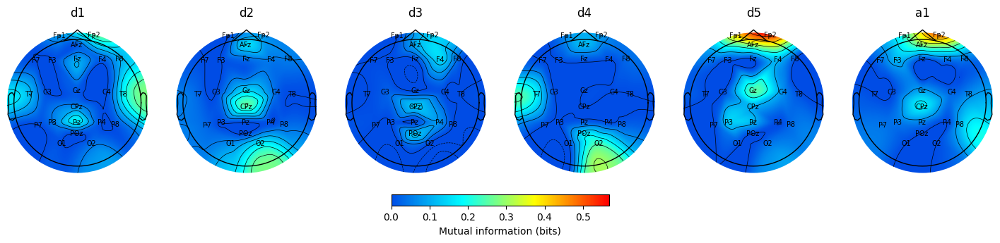

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 46.18%
Std Dev of K-Fold Test Accuracy of KNN: 12.42%
Average K-Fold Test Precision of KNN: 0.39
Average K-Fold Test Recall of KNN: 0.44
Average K-Fold Test F1 Score of KNN: 0.39
Average K-Fold Test ROC AUC of KNN: 0.74
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 40.73%
Std Dev of K-Fold Test Accuracy of Random Forest: 13.49%
Average K-Fold Test Precision of Random Forest: 0.38
Average K-Fold Test Recall of Random Forest: 0.40
Average K-Fold Test F1 Score of Random Forest: 0.35
Average K-Fold Test ROC AUC of Random Forest: 0.78
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 46.36%
Std Dev of K-Fold Test Accuracy of MLP: 17.34%
Average K-Fold Test Precisi

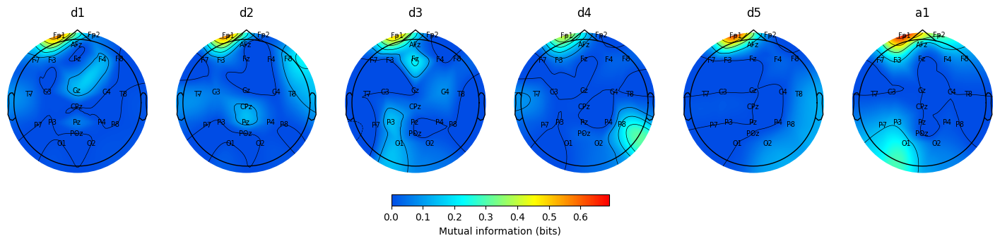

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 44.18%
Std Dev of K-Fold Test Accuracy of KNN: 9.78%
Average K-Fold Test Precision of KNN: 0.36
Average K-Fold Test Recall of KNN: 0.43
Average K-Fold Test F1 Score of KNN: 0.37
Average K-Fold Test ROC AUC of KNN: 0.74
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 74.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 7.03%
Average K-Fold Test Precision of Random Forest: 0.73
Average K-Fold Test Recall of Random Forest: 0.72
Average K-Fold Test F1 Score of Random Forest: 0.69
Average K-Fold Test ROC AUC of Random Forest: 0.91
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 59.09%
Std Dev of K-Fold Test Accuracy of MLP: 12.86%
Average K-Fold Test Precision of MLP: 0.64
Average K-Fold Test Recall of MLP: 0.58
Average K-Fold Test F1 Score of MLP: 0.57
Average K-Fold Test ROC AUC of MLP: 0.88
------------------------------------------------------------
KNN Classification Accuracy: 0.42857142857142855
Random Forest Classification Accuracy: 0.6428571428571429
MLP Classification Accuracy: 0.6428571428571429
Ensemble Classification Accuracy: 0.7142857142857143


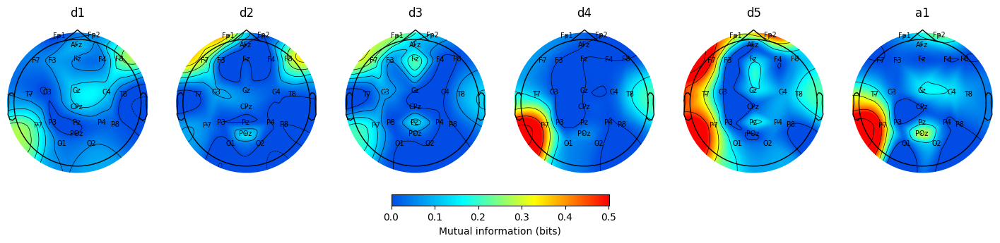

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 46.36%
Std Dev of K-Fold Test Accuracy of KNN: 6.03%
Average K-Fold Test Precision of KNN: 0.37
Average K-Fold Test Recall of KNN: 0.44
Average K-Fold Test F1 Score of KNN: 0.37
Average K-Fold Test ROC AUC of KNN: 0.74
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 66.73%
Std Dev of K-Fold Test Accuracy of Random Forest: 3.88%
Average K-Fold Test Precision of Random Forest: 0.62
Average K-Fold Test Recall of Random Forest: 0.64
Average K-Fold Test F1 Score of Random Forest: 0.61
Average K-Fold Test ROC AUC of Random Forest: 0.86
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 53.64%
Std Dev of K-Fold Test Accuracy of MLP: 12.98%
Average K-Fold Test Precision of MLP: 0.51
Average K-Fold Test Recall of MLP: 0.51
Average K-Fold Test F1 Score of MLP: 0.48
Average K-Fold Test ROC AUC of MLP: 0.75
------------------------------------------------------------
KNN Classification Accuracy: 0.5
Random Forest Classification Accuracy: 0.6428571428571429
MLP Classification Accuracy: 0.5714285714285714
Ensemble Classification Accuracy: 0.6428571428571429


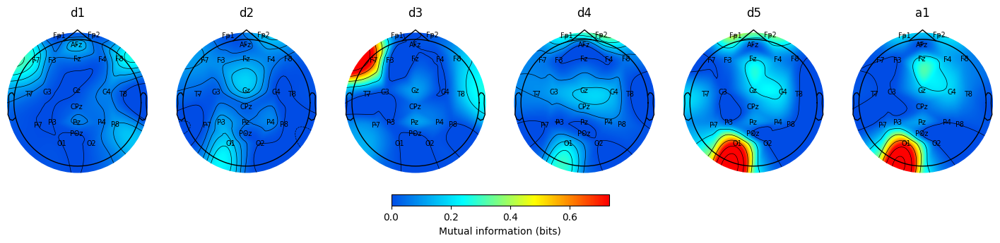

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 35.09%
Std Dev of K-Fold Test Accuracy of KNN: 8.52%
Average K-Fold Test Precision of KNN: 0.26
Average K-Fold Test Recall of KNN: 0.36
Average K-Fold Test F1 Score of KNN: 0.28
Average K-Fold Test ROC AUC of KNN: 0.68
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 46.18%
Std Dev of K-Fold Test Accuracy of Random Forest: 7.42%
Average K-Fold Test Precision of Random Forest: 0.40
Average K-Fold Test Recall of Random Forest: 0.42
Average K-Fold Test F1 Score of Random Forest: 0.38
Average K-Fold Test ROC AUC of Random Forest: 0.73
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 34.91%
Std Dev of K-Fold Test Accuracy of MLP: 17.30%
Average K-Fold Test Precision of MLP: 0.34
Average K-Fold Test Recall of MLP: 0.35
Average K-Fold Test F1 Score of MLP: 0.32
Average K-Fold Test ROC AUC of MLP: 0.71
------------------------------------------------------------
KNN Classification Accuracy: 0.2857142857142857
Random Forest Classification Accuracy: 0.14285714285714285
MLP Classification Accuracy: 0.42857142857142855
Ensemble Classification Accuracy: 0.2857142857142857


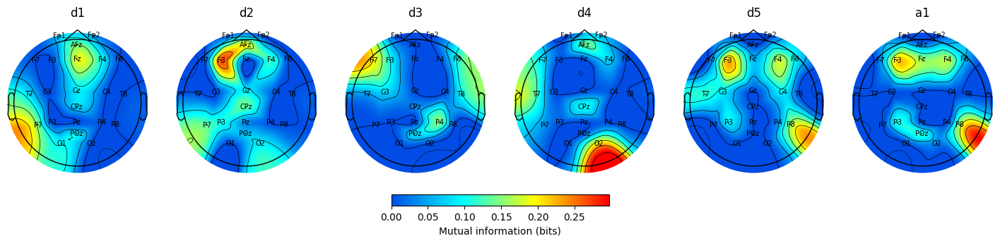

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 24.18%
Std Dev of K-Fold Test Accuracy of KNN: 5.00%
Average K-Fold Test Precision of KNN: 0.14
Average K-Fold Test Recall of KNN: 0.23
Average K-Fold Test F1 Score of KNN: 0.17
Average K-Fold Test ROC AUC of KNN: 0.47
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 53.64%
Std Dev of K-Fold Test Accuracy of Random Forest: 10.12%
Average K-Fold Test Precision of Random Forest: 0.47
Average K-Fold Test Recall of Random Forest: 0.53
Average K-Fold Test F1 Score of Random Forest: 0.48
Average K-Fold Test ROC AUC of Random Forest: 0.71
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 27.82%
Std Dev of K-Fold Test Accuracy of MLP: 10.02%
Average K-Fold Test Precision of MLP: 0.30
Average K-Fold Test Recall of MLP: 0.27
Average K-Fold Test F1 Score of MLP: 0.25
Average K-Fold Test ROC AUC of MLP: 0.54
------------------------------------------------------------
KNN Classification Accuracy: 0.21428571428571427
Random Forest Classification Accuracy: 0.2857142857142857
MLP Classification Accuracy: 0.07142857142857142
Ensemble Classification Accuracy: 0.14285714285714285


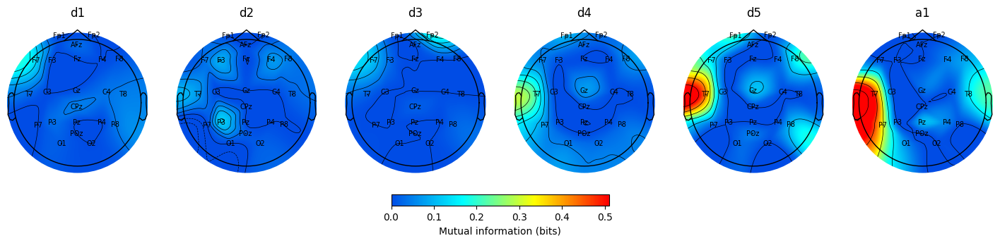

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 18.55%
Std Dev of K-Fold Test Accuracy of KNN: 8.16%
Average K-Fold Test Precision of KNN: 0.16
Average K-Fold Test Recall of KNN: 0.19
Average K-Fold Test F1 Score of KNN: 0.15
Average K-Fold Test ROC AUC of KNN: 0.48
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 29.45%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.29%
Average K-Fold Test Precision of Random Forest: 0.27
Average K-Fold Test Recall of Random Forest: 0.29
Average K-Fold Test F1 Score of Random Forest: 0.26
Average K-Fold Test ROC AUC of Random Forest: 0.55
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 24.55%
Std Dev of K-Fold Test Accuracy of MLP: 13.97%
Average K-Fold Test Precision of MLP: 0.25
Average K-Fold Test Recall of MLP: 0.25
Average K-Fold Test F1 Score of MLP: 0.23
Average K-Fold Test ROC AUC of MLP: 0.49
------------------------------------------------------------
KNN Classification Accuracy: 0.14285714285714285
Random Forest Classification Accuracy: 0.0
MLP Classification Accuracy: 0.14285714285714285
Ensemble Classification Accuracy: 0.07142857142857142


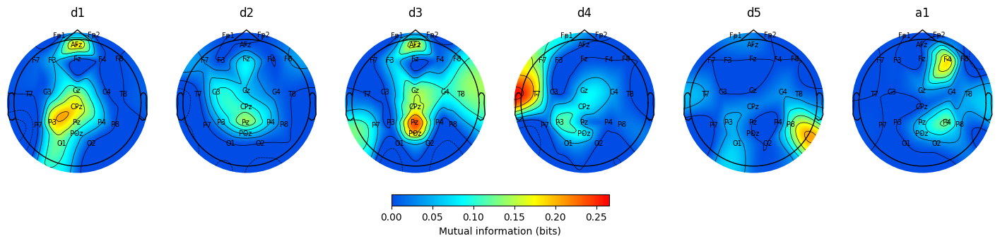

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

63
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 42.00%
Std Dev of K-Fold Test Accuracy of KNN: 11.66%
Average K-Fold Test Precision of KNN: 0.40
Average K-Fold Test Recall of KNN: 0.44
Average K-Fold Test F1 Score of KNN: 0.39
Average K-Fold Test ROC AUC of KNN: 0.63
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 68.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 17.20%
Average K-Fold Test Precision of Random Forest: 0.67
Average K-Fold Test Recall of Random Forest: 0.67
Average K-Fold Test F1 Score of Random Forest: 0.65
Average K-Fold Test ROC AUC of Random Forest: 0.84
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 46.00%
Std Dev of K-Fold Test Accuracy of MLP: 4.90%
Average K-Fold Test Precisio

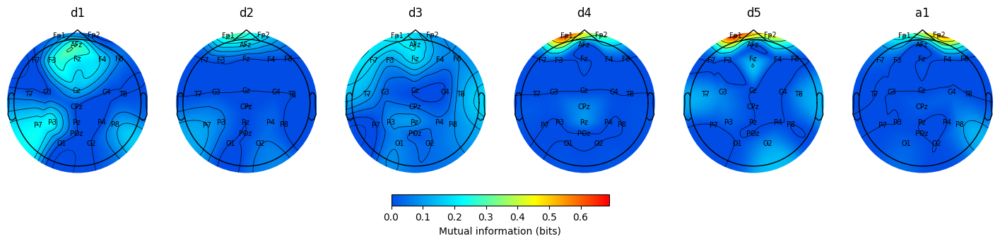

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 35.09%
Std Dev of K-Fold Test Accuracy of KNN: 8.52%
Average K-Fold Test Precision of KNN: 0.27
Average K-Fold Test Recall of KNN: 0.33
Average K-Fold Test F1 Score of KNN: 0.28
Average K-Fold Test ROC AUC of KNN: 0.63
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 38.91%
Std Dev of K-Fold Test Accuracy of Random Forest: 6.76%
Average K-Fold Test Precision of Random Forest: 0.43
Average K-Fold Test Recall of Random Forest: 0.37
Average K-Fold Test F1 Score of Random Forest: 0.37
Average K-Fold Test ROC AUC of Random Forest: 0.69
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 38.91%
Std Dev of K-Fold Test Accuracy of MLP: 10.58%
Average K-Fold Test Precision of MLP: 0.38
Average K-Fold Test Recall of MLP: 0.37
Average K-Fold Test F1 Score of MLP: 0.36
Average K-Fold Test ROC AUC of MLP: 0.65
------------------------------------------------------------
KNN Classification Accuracy: 0.35714285714285715
Random Forest Classification Accuracy: 0.2857142857142857
MLP Classification Accuracy: 0.21428571428571427
Ensemble Classification Accuracy: 0.2857142857142857


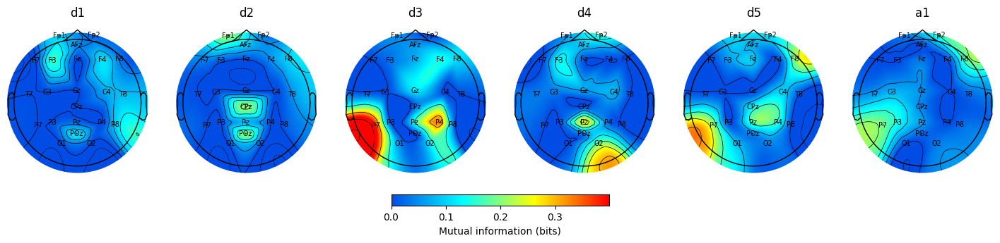

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 31.45%
Std Dev of K-Fold Test Accuracy of KNN: 13.50%
Average K-Fold Test Precision of KNN: 0.29
Average K-Fold Test Recall of KNN: 0.32
Average K-Fold Test F1 Score of KNN: 0.28
Average K-Fold Test ROC AUC of KNN: 0.62
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 27.64%
Std Dev of K-Fold Test Accuracy of Random Forest: 7.75%
Average K-Fold Test Precision of Random Forest: 0.26
Average K-Fold Test Recall of Random Forest: 0.27
Average K-Fold Test F1 Score of Random Forest: 0.25
Average K-Fold Test ROC AUC of Random Forest: 0.58
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 36.91%
Std Dev of K-Fold Test Accuracy of MLP: 14.92%
Average K-Fold Test Precision of MLP: 0.36
Average K-Fold Test Recall of MLP: 0.39
Average K-Fold Test F1 Score of MLP: 0.35
Average K-Fold Test ROC AUC of MLP: 0.59
------------------------------------------------------------
KNN Classification Accuracy: 0.2857142857142857
Random Forest Classification Accuracy: 0.07142857142857142
MLP Classification Accuracy: 0.21428571428571427
Ensemble Classification Accuracy: 0.21428571428571427


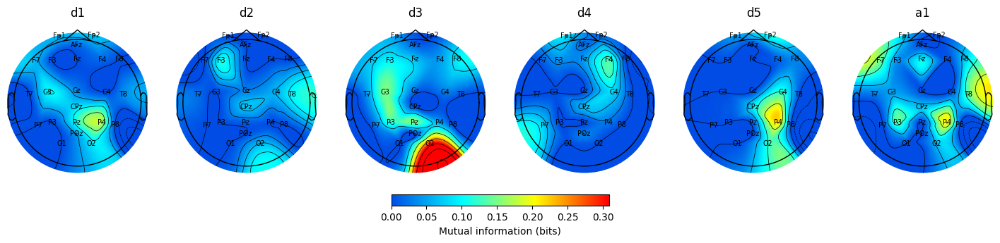

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 64.73%
Std Dev of K-Fold Test Accuracy of KNN: 4.24%
Average K-Fold Test Precision of KNN: 0.52
Average K-Fold Test Recall of KNN: 0.61
Average K-Fold Test F1 Score of KNN: 0.53
Average K-Fold Test ROC AUC of KNN: 0.92
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 77.82%
Std Dev of K-Fold Test Accuracy of Random Forest: 7.13%
Average K-Fold Test Precision of Random Forest: 0.80
Average K-Fold Test Recall of Random Forest: 0.79
Average K-Fold Test F1 Score of Random Forest: 0.78
Average K-Fold Test ROC AUC of Random Forest: 0.93
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 81.45%
Std Dev of K-Fold Test Accuracy of MLP: 9.99%
Average K-Fold Test Precision 

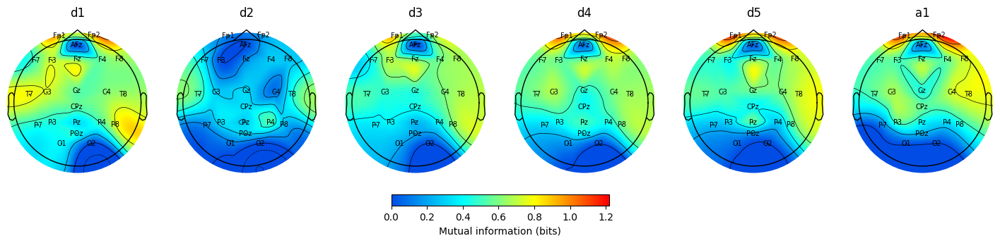

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 74.00%
Std Dev of K-Fold Test Accuracy of KNN: 4.05%
Average K-Fold Test Precision of KNN: 0.59
Average K-Fold Test Recall of KNN: 0.69
Average K-Fold Test F1 Score of KNN: 0.63
Average K-Fold Test ROC AUC of KNN: 0.91
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 88.91%
Std Dev of K-Fold Test Accuracy of Random Forest: 8.88%
Average K-Fold Test Precision of Random Forest: 0.92
Average K-Fold Test Recall of Random Forest: 0.88
Average K-Fold Test F1 Score of Random Forest: 0.87
Average K-Fold Test ROC AUC of Random Forest: 0.99
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 87.09%
Std Dev of K-Fold Test Accuracy of MLP: 9.21%
Average K-Fold Test Precision 

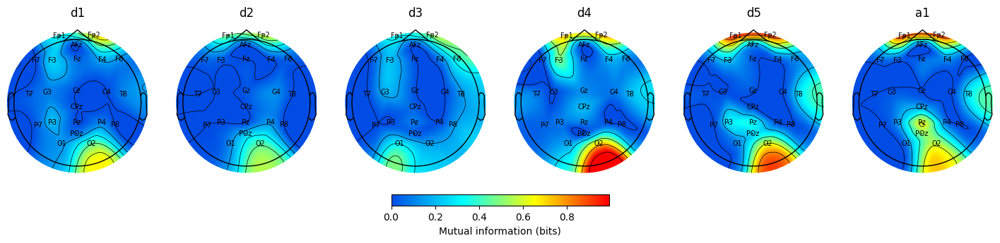

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

53
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 33.61%
Std Dev of K-Fold Test Accuracy of KNN: 9.88%
Average K-Fold Test Precision of KNN: 0.23
Average K-Fold Test Recall of KNN: 0.33
Average K-Fold Test F1 Score of KNN: 0.25
Average K-Fold Test ROC AUC of KNN: 0.55
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 61.94%
Std Dev of K-Fold Test Accuracy of Random Forest: 3.58%
Average K-Fold Test Precision of Random Forest: 0.66
Average K-Fold Test Recall of Random Forest: 0.64
Average K-Fold Test F1 Score of Random Forest: 0.62
Average K-Fold Test ROC AUC of Random Forest: 0.80
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 35.83%
Std Dev of K-Fold Test Accuracy of MLP: 10.77%
Average K-Fold Test Precision of MLP: 0.31
Average K-Fold Test Recall of MLP: 0.38
Average K-Fold Test F1 Score of MLP: 0.32
Average K-Fold Test ROC AUC of MLP: 0.64
------------------------------------------------------------
KNN Classification Accuracy: 0.18181818181818182
Random Forest Classification Accuracy: 0.5454545454545454
MLP Classification Accuracy: 0.09090909090909091
Ensemble Classification Accuracy: 0.2727272727272727


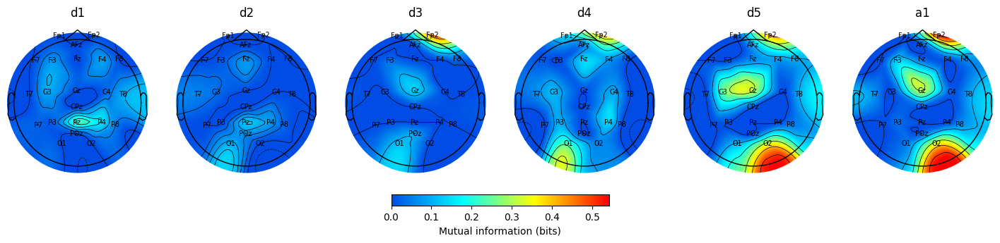

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 29.82%
Std Dev of K-Fold Test Accuracy of KNN: 11.18%
Average K-Fold Test Precision of KNN: 0.31
Average K-Fold Test Recall of KNN: 0.28
Average K-Fold Test F1 Score of KNN: 0.24
Average K-Fold Test ROC AUC of KNN: 0.52
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 10.91%
Std Dev of K-Fold Test Accuracy of Random Forest: 6.80%
Average K-Fold Test Precision of Random Forest: 0.12
Average K-Fold Test Recall of Random Forest: 0.12
Average K-Fold Test F1 Score of Random Forest: 0.11
Average K-Fold Test ROC AUC of Random Forest: 0.37
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 25.82%
Std Dev of K-Fold Test Accuracy of MLP: 8.64%
Average K-Fold Test Precision of MLP: 0.31
Average K-Fold Test Recall of MLP: 0.27
Average K-Fold Test F1 Score of MLP: 0.26
Average K-Fold Test ROC AUC of MLP: 0.48
------------------------------------------------------------
KNN Classification Accuracy: 0.42857142857142855
Random Forest Classification Accuracy: 0.21428571428571427
MLP Classification Accuracy: 0.2857142857142857
Ensemble Classification Accuracy: 0.42857142857142855


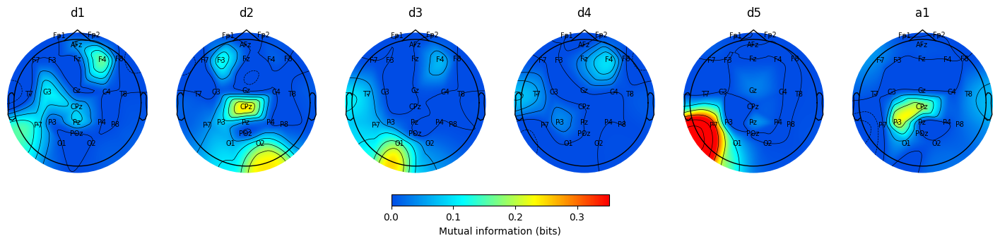

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 48.00%
Std Dev of K-Fold Test Accuracy of KNN: 9.93%
Average K-Fold Test Precision of KNN: 0.47
Average K-Fold Test Recall of KNN: 0.48
Average K-Fold Test F1 Score of KNN: 0.45
Average K-Fold Test ROC AUC of KNN: 0.77
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 52.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 9.93%
Average K-Fold Test Precision of Random Forest: 0.50
Average K-Fold Test Recall of Random Forest: 0.53
Average K-Fold Test F1 Score of Random Forest: 0.49
Average K-Fold Test ROC AUC of Random Forest: 0.84
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 50.00%
Std Dev of K-Fold Test Accuracy of MLP: 7.04%
Average K-Fold Test Precision of MLP: 0.51
Average K-Fold Test Recall of MLP: 0.52
Average K-Fold Test F1 Score of MLP: 0.49
Average K-Fold Test ROC AUC of MLP: 0.79
------------------------------------------------------------
KNN Classification Accuracy: 0.35714285714285715
Random Forest Classification Accuracy: 0.42857142857142855
MLP Classification Accuracy: 0.2857142857142857
Ensemble Classification Accuracy: 0.35714285714285715


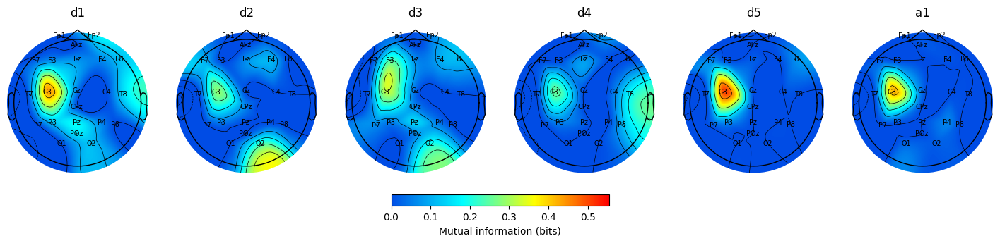

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 29.45%
Std Dev of K-Fold Test Accuracy of KNN: 10.25%
Average K-Fold Test Precision of KNN: 0.23
Average K-Fold Test Recall of KNN: 0.28
Average K-Fold Test F1 Score of KNN: 0.24
Average K-Fold Test ROC AUC of KNN: 0.62
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 42.55%
Std Dev of K-Fold Test Accuracy of Random Forest: 8.95%
Average K-Fold Test Precision of Random Forest: 0.32
Average K-Fold Test Recall of Random Forest: 0.44
Average K-Fold Test F1 Score of Random Forest: 0.36
Average K-Fold Test ROC AUC of Random Forest: 0.76
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 37.27%
Std Dev of K-Fold Test Accuracy of MLP: 21.20%
Average K-Fold Test Precision of MLP: 0.38
Average K-Fold Test Recall of MLP: 0.38
Average K-Fold Test F1 Score of MLP: 0.33
Average K-Fold Test ROC AUC of MLP: 0.68
------------------------------------------------------------
KNN Classification Accuracy: 0.35714285714285715
Random Forest Classification Accuracy: 0.2857142857142857
MLP Classification Accuracy: 0.42857142857142855
Ensemble Classification Accuracy: 0.35714285714285715


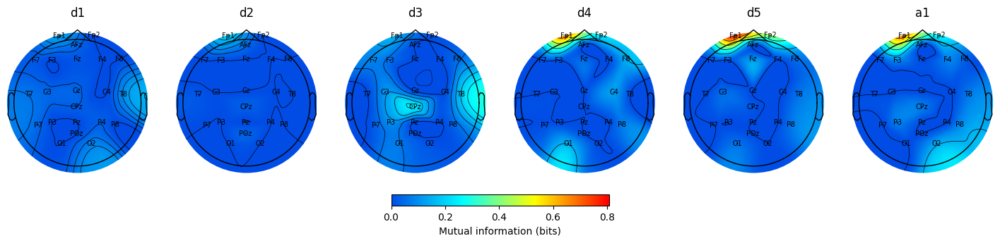

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


55
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 34.17%
Std Dev of K-Fold Test Accuracy of KNN: 12.29%
Average K-Fold Test Precision of KNN: 0.33
Average K-Fold Test Recall of KNN: 0.35
Average K-Fold Test F1 Score of KNN: 0.31
Average K-Fold Test ROC AUC of KNN: 0.71
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 72.78%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.17%
Average K-Fold Test Precision of Random Forest: 0.78
Average K-Fold Test Recall of Random Forest: 0.72
Average K-Fold Test F1 Score of Random Forest: 0.70
Average K-Fold Test ROC AUC of Random Forest: 0.91
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 59.44%
Std Dev of K-Fold Test Accuracy of MLP: 14.44%
Average K-Fold Test Precision of MLP: 0.66
Average K-Fold Test Recall of MLP: 0.59
Average K-Fold Test F1 Score of MLP: 0.58
Average K-Fold Test ROC AUC of MLP: 0.81
------------------------------------------------------------
KNN Classification Accuracy: 0.45454545454545453
Random Forest Classification Accuracy: 0.8181818181818182
MLP Classification Accuracy: 0.6363636363636364
Ensemble Classification Accuracy: 0.7272727272727273


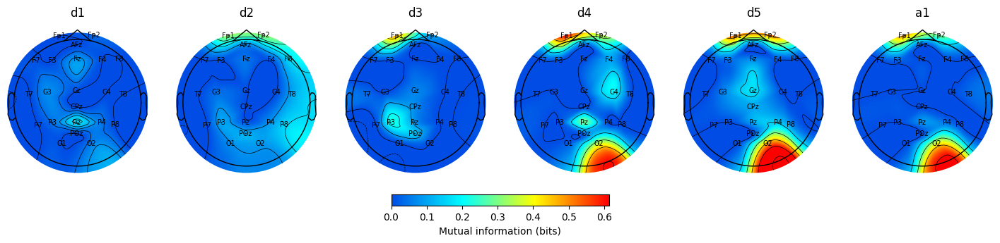

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

66
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 28.73%
Std Dev of K-Fold Test Accuracy of KNN: 10.39%
Average K-Fold Test Precision of KNN: 0.24
Average K-Fold Test Recall of KNN: 0.28
Average K-Fold Test F1 Score of KNN: 0.22
Average K-Fold Test ROC AUC of KNN: 0.52
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 61.82%
Std Dev of K-Fold Test Accuracy of Random Forest: 12.71%
Average K-Fold Test Precision of Random Forest: 0.58
Average K-Fold Test Recall of Random Forest: 0.59
Average K-Fold Test F1 Score of Random Forest: 0.56
Average K-Fold Test ROC AUC of Random Forest: 0.76
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 42.73%
Std Dev of K-Fold Test Accuracy of MLP: 9.36%
Average K-Fold Test Precision of MLP: 0.35
Average K-Fold Test Recall of MLP: 0.41
Average K-Fold Test F1 Score of MLP: 0.36
Average K-Fold Test ROC AUC of MLP: 0.58
------------------------------------------------------------
KNN Classification Accuracy: 0.2857142857142857
Random Forest Classification Accuracy: 0.42857142857142855
MLP Classification Accuracy: 0.35714285714285715
Ensemble Classification Accuracy: 0.35714285714285715


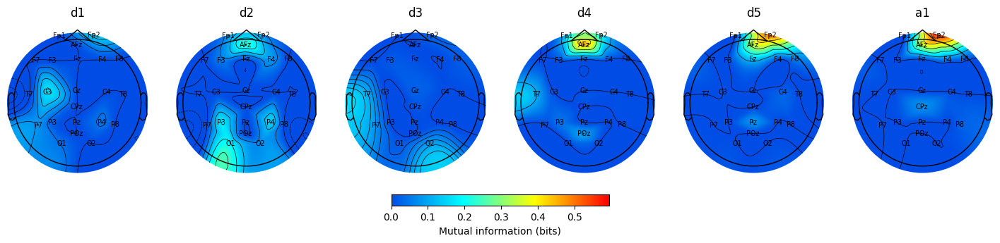

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 44.00%
Std Dev of K-Fold Test Accuracy of KNN: 12.67%
Average K-Fold Test Precision of KNN: 0.32
Average K-Fold Test Recall of KNN: 0.42
Average K-Fold Test F1 Score of KNN: 0.35
Average K-Fold Test ROC AUC of KNN: 0.70
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 79.82%
Std Dev of K-Fold Test Accuracy of Random Forest: 8.69%
Average K-Fold Test Precision of Random Forest: 0.76
Average K-Fold Test Recall of Random Forest: 0.79
Average K-Fold Test F1 Score of Random Forest: 0.76
Average K-Fold Test ROC AUC of Random Forest: 0.91
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 51.64%
Std Dev of K-Fold Test Accuracy of MLP: 8.18%
Average K-Fold Test Precision of MLP: 0.53
Average K-Fold Test Recall of MLP: 0.51
Average K-Fold Test F1 Score of MLP: 0.50
Average K-Fold Test ROC AUC of MLP: 0.78
------------------------------------------------------------
KNN Classification Accuracy: 0.2857142857142857
Random Forest Classification Accuracy: 0.7142857142857143
MLP Classification Accuracy: 0.6428571428571429
Ensemble Classification Accura

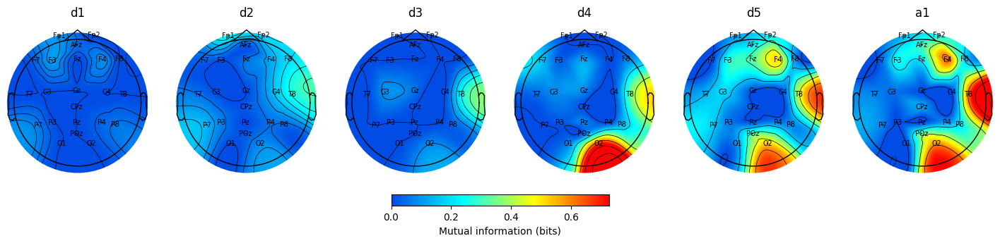

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 29.82%
Std Dev of K-Fold Test Accuracy of KNN: 9.59%
Average K-Fold Test Precision of KNN: 0.24
Average K-Fold Test Recall of KNN: 0.30
Average K-Fold Test F1 Score of KNN: 0.24
Average K-Fold Test ROC AUC of KNN: 0.58
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 40.91%
Std Dev of K-Fold Test Accuracy of Random Forest: 12.86%
Average K-Fold Test Precision of Random Forest: 0.41
Average K-Fold Test Recall of Random Forest: 0.42
Average K-Fold Test F1 Score of Random Forest: 0.38
Average K-Fold Test ROC AUC of Random Forest: 0.62
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 29.64%
Std Dev of K-Fold Test Accuracy of MLP: 14.52%
Average K-Fold Test Precision of MLP: 0.27
Average K-Fold Test Recall of MLP: 0.33
Average K-Fold Test F1 Score of MLP: 0.28
Average K-Fold Test ROC AUC of MLP: 0.55
------------------------------------------------------------
KNN Classification Accuracy: 0.42857142857142855
Random Forest Classification Accuracy: 0.5714285714285714
MLP Classification Accuracy: 0.5
Ensemble Classification Accuracy: 0.6428571428571429


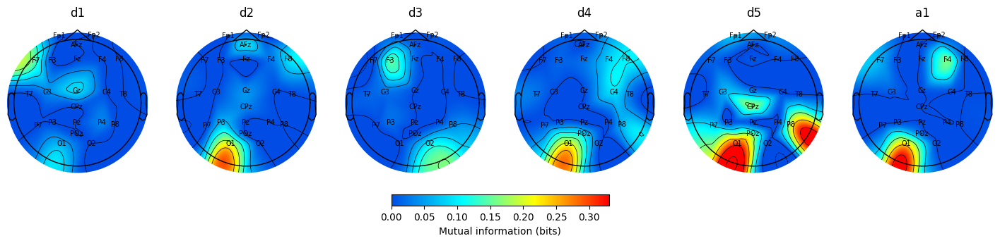

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 25.82%
Std Dev of K-Fold Test Accuracy of KNN: 13.18%
Average K-Fold Test Precision of KNN: 0.18
Average K-Fold Test Recall of KNN: 0.25
Average K-Fold Test F1 Score of KNN: 0.19
Average K-Fold Test ROC AUC of KNN: 0.58
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 57.64%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.72%
Average K-Fold Test Precision of Random Forest: 0.55
Average K-Fold Test Recall of Random Forest: 0.57
Average K-Fold Test F1 Score of Random Forest: 0.51
Average K-Fold Test ROC AUC of Random Forest: 0.84
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 35.45%
Std Dev of K-Fold Test Accuracy of MLP: 10.12%
Average K-Fold Test Precision of MLP: 0.36
Average K-Fold Test Recall of MLP: 0.37
Average K-Fold Test F1 Score of MLP: 0.33
Average K-Fold Test ROC AUC of MLP: 0.66
------------------------------------------------------------
KNN Classification Accuracy: 0.35714285714285715
Random Forest Classification Accuracy: 0.35714285714285715
MLP Classification Accuracy: 0.35714285714285715
Ensemble Classification Accuracy: 0.42857142857142855


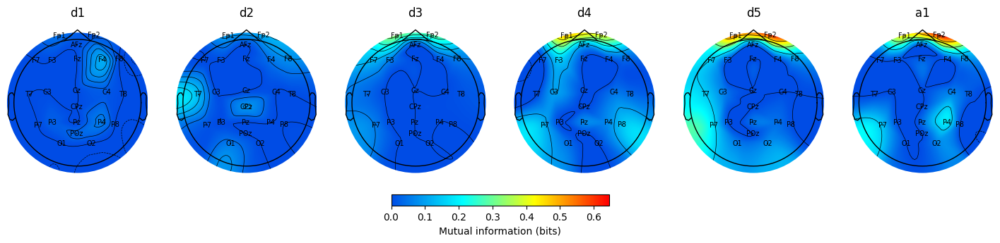

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)


68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 66.36%
Std Dev of K-Fold Test Accuracy of KNN: 8.91%
Average K-Fold Test Precision of KNN: 0.68
Average K-Fold Test Recall of KNN: 0.64
Average K-Fold Test F1 Score of KNN: 0.62
Average K-Fold Test ROC AUC of KNN: 0.87
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 75.82%
Std Dev of K-Fold Test Accuracy of Random Forest: 9.55%
Average K-Fold Test Precision of Random Forest: 0.73
Average K-Fold Test Recall of Random Forest: 0.73
Average K-Fold Test F1 Score of Random Forest: 0.71
Average K-Fold Test ROC AUC of Random Forest: 0.93
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 70.36%
Std Dev of K-Fold Test Accuracy of MLP: 12.03%
Average K-Fold Test Precision of MLP: 0.65
Average K-Fold Test Recall of MLP: 0.69
Average K-Fold Test F1 Score of MLP: 0.65
Average K-Fold Test ROC AUC of MLP: 0.91
------------------------------------------------------------
KNN Classification Accuracy: 0.7857142857142857
Random Forest Classification Accuracy: 0.7142857142857143
MLP Classification Accuracy: 0.6428571428571429
Ensemble Classification Accuracy: 0.7142857142857143


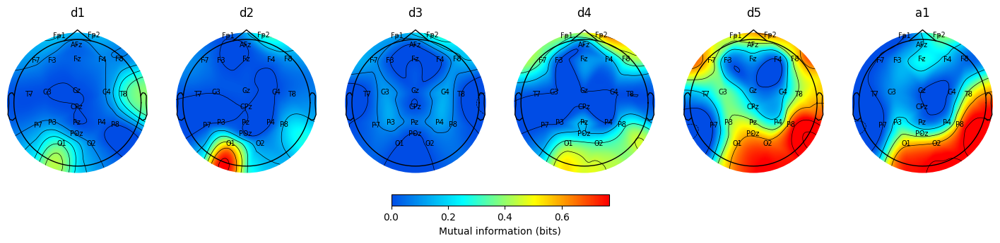

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 60.91%
Std Dev of K-Fold Test Accuracy of KNN: 13.97%
Average K-Fold Test Precision of KNN: 0.59
Average K-Fold Test Recall of KNN: 0.62
Average K-Fold Test F1 Score of KNN: 0.59
Average K-Fold Test ROC AUC of KNN: 0.88
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 98.18%
Std Dev of K-Fold Test Accuracy of Random Forest: 3.64%
Average K-Fold Test Precision of Random Forest: 0.98
Average K-Fold Test Recall of Random Forest: 0.98
Average K-Fold Test F1 Score of Random Forest: 0.98
Average K-Fold Test ROC AUC of Random Forest: 1.00
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 68.36%
Std Dev of K-Fold Test Accuracy of MLP: 11.36%
Average K-Fold Test Precisio

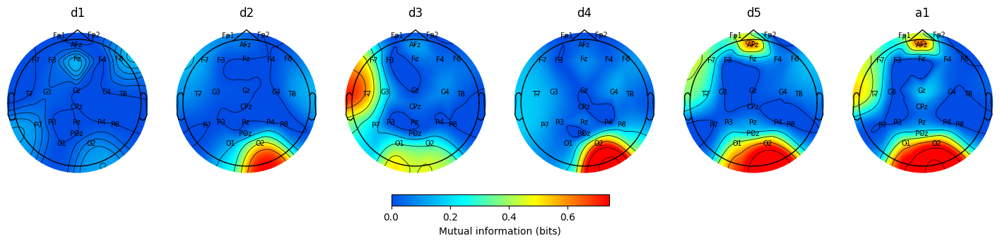

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 33.27%
Std Dev of K-Fold Test Accuracy of KNN: 3.88%
Average K-Fold Test Precision of KNN: 0.27
Average K-Fold Test Recall of KNN: 0.32
Average K-Fold Test F1 Score of KNN: 0.25
Average K-Fold Test ROC AUC of KNN: 0.46
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 22.36%
Std Dev of K-Fold Test Accuracy of Random Forest: 7.75%
Average K-Fold Test Precision of Random Forest: 0.21
Average K-Fold Test Recall of Random Forest: 0.23
Average K-Fold Test F1 Score of Random Forest: 0.19
Average K-Fold Test ROC AUC of Random Forest: 0.49
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 25.82%
Std Dev of K-Fold Test Accuracy of MLP: 13.18%
Average K-Fold Test Precision of MLP: 0.25
Average K-Fold Test Recall of MLP: 0.26
Average K-Fold Test F1 Score of MLP: 0.24
Average K-Fold Test ROC AUC of MLP: 0.52
------------------------------------------------------------
KNN Classification Accuracy: 0.21428571428571427
Random Forest Classification Accuracy: 0.2857142857142857
MLP Classification Accuracy: 0.2857142857142857
Ensemble Classification Accuracy: 0.42857142857142855


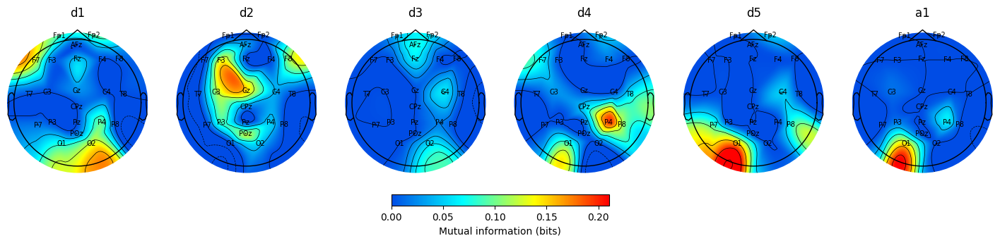

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

67
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 54.55%
Std Dev of K-Fold Test Accuracy of KNN: 12.53%
Average K-Fold Test Precision of KNN: 0.42
Average K-Fold Test Recall of KNN: 0.53
Average K-Fold Test F1 Score of KNN: 0.45
Average K-Fold Test ROC AUC of KNN: 0.78
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 73.64%
Std Dev of K-Fold Test Accuracy of Random Forest: 6.66%
Average K-Fold Test Precision of Random Forest: 0.63
Average K-Fold Test Recall of Random Forest: 0.71
Average K-Fold Test F1 Score of Random Forest: 0.66
Average K-Fold Test ROC AUC of Random Forest: 0.90
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 48.91%
Std Dev of K-Fold Test Accuracy of MLP: 18.13%
Average K-Fold Test Precision of MLP: 0.53
Average K-Fold Test Recall of MLP: 0.47
Average K-Fold Test F1 Score of MLP: 0.48
Average K-Fold Test ROC AUC of MLP: 0.74
------------------------------------------------------------
KNN Classification Accuracy: 0.21428571428571427
Random Forest Classification Accuracy: 0.5
MLP Classification Accuracy: 0.5714285714285714
Ensemble Classification Accuracy: 0.5


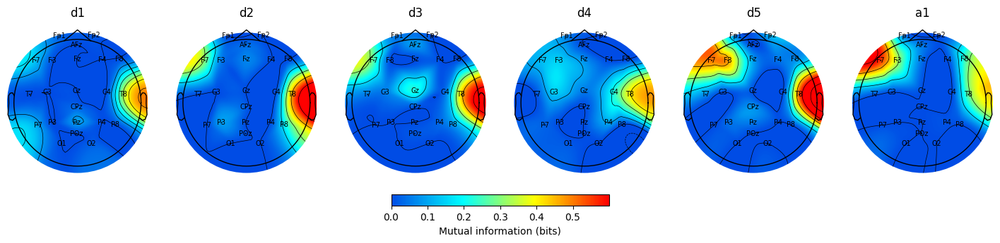

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 40.73%
Std Dev of K-Fold Test Accuracy of KNN: 14.66%
Average K-Fold Test Precision of KNN: 0.38
Average K-Fold Test Recall of KNN: 0.39
Average K-Fold Test F1 Score of KNN: 0.36
Average K-Fold Test ROC AUC of KNN: 0.67
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 70.55%
Std Dev of K-Fold Test Accuracy of Random Forest: 13.08%
Average K-Fold Test Precision of Random Forest: 0.69
Average K-Fold Test Recall of Random Forest: 0.69
Average K-Fold Test F1 Score of Random Forest: 0.66
Average K-Fold Test ROC AUC of Random Forest: 0.87
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 42.91%
Std Dev of K-Fold Test Accuracy of MLP: 14.75%
Average K-Fold Test Precision of MLP: 0.42
Average K-Fold Test Recall of MLP: 0.42
Average K-Fold Test F1 Score of MLP: 0.40
Average K-Fold Test ROC AUC of MLP: 0.66
------------------------------------------------------------
KNN Classification Accuracy: 0.2857142857142857
Random Forest Classification Accuracy: 0.5
MLP Classification Accuracy: 0.2857142857142857
Ensemble Classification Accuracy: 0.35714285714285715


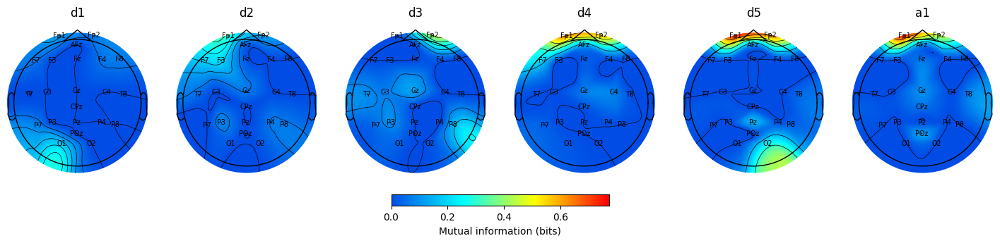

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 33.09%
Std Dev of K-Fold Test Accuracy of KNN: 11.92%
Average K-Fold Test Precision of KNN: 0.28
Average K-Fold Test Recall of KNN: 0.34
Average K-Fold Test F1 Score of KNN: 0.29
Average K-Fold Test ROC AUC of KNN: 0.61
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 48.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 12.84%
Average K-Fold Test Precision of Random Forest: 0.48
Average K-Fold Test Recall of Random Forest: 0.48
Average K-Fold Test F1 Score of Random Forest: 0.45
Average K-Fold Test ROC AUC of Random Forest: 0.78
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 42.00%
Std Dev of K-Fold Test Accuracy of MLP: 23.17%
Average K-Fold Test Precision of MLP: 0.41
Average K-Fold Test Recall of MLP: 0.42
Average K-Fold Test F1 Score of MLP: 0.40
Average K-Fold Test ROC AUC of MLP: 0.62
------------------------------------------------------------
KNN Classification Accuracy: 0.14285714285714285
Random Forest Classification Accuracy: 0.21428571428571427
MLP Classification Accuracy: 0.42857142857142855
Ensemble Classification Accuracy: 0.35714285714285715


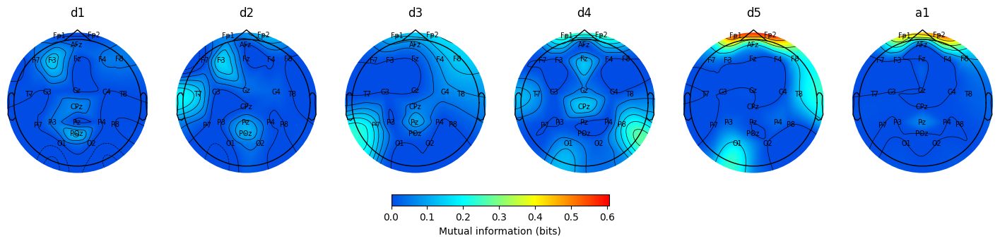

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 33.09%
Std Dev of K-Fold Test Accuracy of KNN: 14.43%
Average K-Fold Test Precision of KNN: 0.33
Average K-Fold Test Recall of KNN: 0.36
Average K-Fold Test F1 Score of KNN: 0.32
Average K-Fold Test ROC AUC of KNN: 0.57
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 63.09%
Std Dev of K-Fold Test Accuracy of Random Forest: 9.51%
Average K-Fold Test Precision of Random Forest: 0.68
Average K-Fold Test Recall of Random Forest: 0.66
Average K-Fold Test F1 Score of Random Forest: 0.63
Average K-Fold Test ROC AUC of Random Forest: 0.81
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 39.27%
Std Dev of K-Fold Test Accuracy of MLP: 14.80%
Average K-Fold Test Precisio

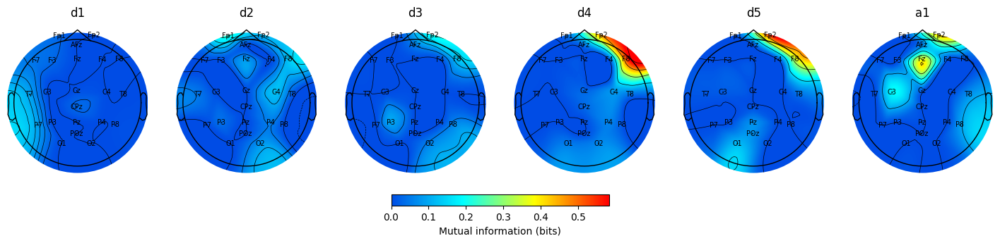

/tmp/ipykernel_190796/4078908164.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

68
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 18.36%
Std Dev of K-Fold Test Accuracy of KNN: 7.93%
Average K-Fold Test Precision of KNN: 0.14
Average K-Fold Test Recall of KNN: 0.18
Average K-Fold Test F1 Score of KNN: 0.15
Average K-Fold Test ROC AUC of KNN: 0.49
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 35.09%
Std Dev of K-Fold Test Accuracy of Random Forest: 2.55%
Average K-Fold Test Precision of Random Forest: 0.33
Average K-Fold Test Recall of Random Forest: 0.33
Average K-Fold Test F1 Score of Random Forest: 0.30
Average K-Fold Test ROC AUC of Random Forest: 0.53
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 22.18%
Std Dev of K-Fold Test Accuracy of MLP: 13.53%
Average K-Fold Test Precision of MLP: 0.20
Average K-Fold Test Recall of MLP: 0.22
Average K-Fold Test F1 Score of MLP: 0.19
Average K-Fold Test ROC AUC of MLP: 0.57
------------------------------------------------------------
KNN Classification Accuracy: 0.42857142857142855
Random Forest Classification Accuracy: 0.35714285714285715
MLP Classification Accuracy: 0.42857142857142855
Ensemble Classification Ac

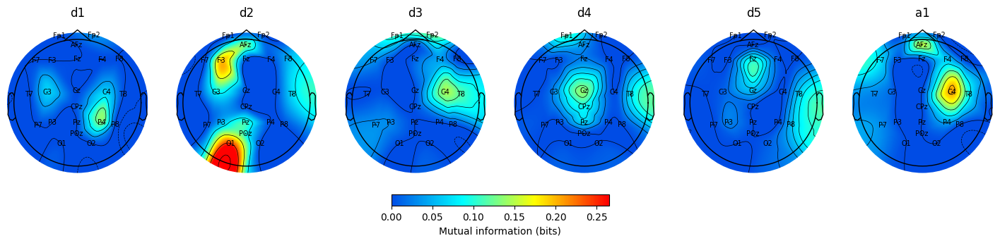

In [15]:
# Loop through IDs
for ID in range(1,35):
    ID = [ID]
    try:
        X_train, X_test, y_train, y_test = load_IDs(df, ID, types, mod)
        models, scores = train_all(X_train, y_train)
        y_test_encoded = le.fit_transform(y_test)
        accs,ensemble_preds = calculate_acc(y_test_encoded, models)    
        # Append results to the list
        for i, type_test in enumerate(['KNN', 'RF', 'MLP']):
            df_ids_list.append([
                ID[0],
                type_test,
                scores[i]['test_accuracy'].mean(),
                np.std(scores[i]['test_accuracy']),
                scores[i]['test_precision_macro'].mean(),
                scores[i]['test_recall_macro'].mean(),
                scores[i]['test_f1_macro'].mean(),
                scores[i]['test_roc_auc_ovr'].mean(),
                accs[i]
            ])
    except:
        pass
    
    # Plot and save topoplot
    fig_name = 'topoplot_' + str(ID[0])
    plot_topoplot(X_train, y_train, info, custom_cmap, save=True, model_name=model_name, fig_name=fig_name)

# Create the DataFrame from the list
df_ids = pd.DataFrame(df_ids_list, columns=['ID', 'test', 'acc', 'test_std','precision', 'recall', 'F1', 'ROC', 'test_acc'])

In [16]:
df_ids

,ID,test,acc,test_std,precision,recall,F1,ROC,test_acc
0,2,KNN,0.312727,0.066457,0.361667,0.341667,0.327302,0.674901,0.642857
1,2,RF,0.480000,0.099320,0.525595,0.500000,0.485119,0.745908,0.571429
2,2,MLP,0.465455,0.160000,0.545000,0.483333,0.496587,0.708978,0.428571
3,3,KNN,0.445455,0.072727,0.380833,0.416667,0.381746,0.670536,0.357143
4,3,RF,0.592727,0.070512,0.600000,0.583333,0.582857,0.824256,0.500000
...,...,...,...,...,...,...,...,...,...
94,33,RF,0.630909,0.095103,0.679167,0.658333,0.628214,0.810069,0.571429
95,33,MLP,0.392727,0.147978,0.426667,0.416667,0.407738,0.645288,0.500000
96,34,KNN,0.183636,0.079336,0.143333,0.183333,0.150516,0.488690,0.428571
97,34,RF,0.350909,0.025455,0.328095,0.333333,0.298889,0.530804,0.357143


### Get best training models and scores 

In [17]:
df = df_ids.copy()
# Find the index of the rows with the highest accuracy for each ID
idx = df.groupby('ID')['acc'].idxmax()

# Use these indices to select the corresponding rows
best_tests = df.loc[idx]
best_tests

,ID,test,acc,test_std,precision,recall,F1,ROC,test_acc
1,2,RF,0.480000,0.099320,0.525595,0.500000,0.485119,0.745908,0.571429
4,3,RF,0.592727,0.070512,0.600000,0.583333,0.582857,0.824256,0.500000
7,4,RF,0.738182,0.140177,0.750833,0.758333,0.737024,0.922718,0.785714
10,5,RF,0.900000,0.063246,0.938333,0.883333,0.886548,0.970238,0.923077
14,6,MLP,0.461818,0.136836,0.473333,0.466667,0.455476,0.653274,0.357143
17,7,MLP,0.463636,0.173443,0.435000,0.450000,0.430476,0.766369,0.428571
19,8,RF,0.740000,0.070324,0.726667,0.716667,0.691429,0.909499,0.642857
22,9,RF,0.667273,0.038826,0.620833,0.641667,0.614048,0.859102,0.642857
25,10,RF,0.461818,0.074168,0.396845,0.425000,0.377987,0.730605,0.142857
28,11,RF,0.536364,0.101232,0.469167,0.533333,0.484206,0.708978,0.285714


### Read subjects description

In [18]:
sub_desc = pd.read_csv('/mnt/d/sharegit/MasterThesis_data/participants.tsv', delimiter = '\t')
sub_desc['Subject'] = np.arange(1,35)
sub_desc = sub_desc.rename(columns={"Subject": "ID"})
sub_desc

,ID,Age,Edinburgh Test,Laterality,Gender
0,1,23,23,Right,Male
1,2,21,26,Right,Male
2,3,23,22,Right,Female
3,4,21,21,Right,Female
4,5,23,25,Right,Female
5,6,23,18,Right,Male
6,7,22,20,Right,Female
7,8,20,21,Right,Female
8,9,28,26,Right,Male
9,10,23,18,Right,Male


### Score assessment

In [19]:
def read_ans(filename):
    # Read the content of the answer text file and store it as a list of lines
    with open(filename, 'r') as file:
        answer_lines = file.readlines()
    print(len(answer_lines))
    a = np.zeros((len(answer_lines),4))
    i = 0
    for line in answer_lines:
        a[i, :] = [int(char) for char in line.strip()]  # Convert each character to an integer
        i += 1  # Increment the row index
    da = np.diff(a)
    da[da > 1] = 1
    da[da < 1] = -1
    return [a,da]

def score(filename,a,da):
    # Read the content of the answer text file and store it as a list of lines
    with open(filename, 'r') as file:
        response = file.readlines()
    r = np.zeros((len(response),4))
    i = 0
    for line in response:
        # Split the line by tab characters and convert each part to an integer
        r[i, :] = [int(value) for value in line.strip().split('\t') if value]  
        i += 1  # Increment the row index
    dr = np.diff(r)       
    dr[dr > 1] = 1
    dr[dr < 1] = -1
    r_ex = np.sum(a == r,axis = 1)
    r_chg = np.sum(da == dr,axis = 1)
    return [r_ex,r_chg]


def summary(r_ex,r_chg):
    output = np.zeros((8))
    output[0] = np.sum(r_ex[0:16])
    output[1] = np.sum(r_ex[17:36])
    output[2] = np.sum(r_ex[37:56])
    output[4] = np.sum(r_chg[0:16])
    output[5] = np.sum(r_chg[17:36])
    output[6] = np.sum(r_chg[37:56])
    output[3] = np.sum(r_ex)
    output[7] = np.sum(r_chg)        
    return output

def summary_porcentage(df):
    df['eAir'] = (df['eAir'] / 68) * 100
    df['eVib'] = (df['eVib'] / 80) * 100
    df['eCar'] = (df['eCar'] / 80) * 100
    df['eAll'] = (df['eAll'] / 228) * 100
    df['dAir'] = (df['dAir'] / 51) * 100
    df['dVib'] = (df['dVib'] / 60) * 100
    df['dCar'] = (df['dCar'] / 60) * 100
    df['dAll'] = (df['dAll'] / 171) * 100
    return df

In [20]:
# Main Execution Block
[answers, answers_diffs] = read_ans("/mnt/d/sharegit/MasterThesis_data/NeurosenseDB/PerceivedResponseAnswersheet.txt")

output = []
for folder_sub in range(1, 35):
    [r_ex, r_chg] = score(f"/mnt/d/sharegit/MasterThesis_data/NeurosenseDB/sub-{folder_sub:02d}/other/sub-{folder_sub:02d}_R.tsv", answers, answers_diffs)
    folder_sub = [folder_sub]
    folder_sub.extend(summary(r_ex, r_chg).tolist())  # Use extend to append values to the list
    output.append(folder_sub)

df_scores = pd.DataFrame(output, columns=["ID", "eAir", "eVib", "eCar", "eAll", "dAir", "dVib", "dCar", "dAll"])
df_scores = df_scores[(df != 0).all(axis=1)]
df_scores.reset_index(drop=True, inplace=True)
df_scores = summary_porcentage(df_scores)
df_scores

57


/tmp/ipykernel_190796/3742212303.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_scores = df_scores[(df != 0).all(axis=1)]


,ID,eAir,eVib,eCar,eAll,dAir,dVib,dCar,dAll
0,1,45.588235,75.00,43.75,57.017544,60.784314,86.666667,76.666667,78.362573
1,2,63.235294,83.75,56.25,70.614035,78.431373,86.666667,75.000000,83.625731
2,3,48.529412,87.50,55.00,67.543860,72.549020,93.333333,83.333333,88.304094
3,4,69.117647,87.50,61.25,75.438596,84.313725,95.000000,81.666667,90.058480
4,5,55.882353,87.50,68.75,73.684211,68.627451,91.666667,81.666667,84.210526
5,6,70.588235,82.50,75.00,80.701754,78.431373,91.666667,86.666667,90.643275
6,7,60.294118,77.50,47.50,63.596491,82.352941,85.000000,73.333333,84.210526
7,8,47.058824,85.00,70.00,71.052632,64.705882,90.000000,90.000000,85.380117
8,9,69.117647,92.50,55.00,77.631579,88.235294,95.000000,81.666667,93.567251
9,10,60.294118,87.50,48.75,67.982456,78.431373,93.333333,80.000000,87.134503


In [21]:
df_summary = sub_desc.copy()
df_summary = df_summary.merge(df_scores, left_on='ID', right_on='ID')
df_summary = df_summary.merge(best_tests, left_on='ID', right_on='ID')
df_summary

,ID,Age,Edinburgh Test,Laterality,Gender,eAir,eVib,eCar,eAll,dAir,...,dCar,dAll,test,acc,test_std,precision,recall,F1,ROC,test_acc
0,2,21,26,Right,Male,63.235294,83.75,56.25,70.614035,78.431373,...,75.000000,83.625731,RF,0.480000,0.099320,0.525595,0.500000,0.485119,0.745908,0.571429
1,3,23,22,Right,Female,48.529412,87.50,55.00,67.543860,72.549020,...,83.333333,88.304094,RF,0.592727,0.070512,0.600000,0.583333,0.582857,0.824256,0.500000
2,4,21,21,Right,Female,69.117647,87.50,61.25,75.438596,84.313725,...,81.666667,90.058480,RF,0.738182,0.140177,0.750833,0.758333,0.737024,0.922718,0.785714
3,5,23,25,Right,Female,55.882353,87.50,68.75,73.684211,68.627451,...,81.666667,84.210526,RF,0.900000,0.063246,0.938333,0.883333,0.886548,0.970238,0.923077
4,6,23,18,Right,Male,70.588235,82.50,75.00,80.701754,78.431373,...,86.666667,90.643275,MLP,0.461818,0.136836,0.473333,0.466667,0.455476,0.653274,0.357143
5,7,22,20,Right,Female,60.294118,77.50,47.50,63.596491,82.352941,...,73.333333,84.210526,MLP,0.463636,0.173443,0.435000,0.450000,0.430476,0.766369,0.428571
6,8,20,21,Right,Female,47.058824,85.00,70.00,71.052632,64.705882,...,90.000000,85.380117,RF,0.740000,0.070324,0.726667,0.716667,0.691429,0.909499,0.642857
7,9,28,26,Right,Male,69.117647,92.50,55.00,77.631579,88.235294,...,81.666667,93.567251,RF,0.667273,0.038826,0.620833,0.641667,0.614048,0.859102,0.642857
8,10,23,18,Right,Male,60.294118,87.50,48.75,67.982456,78.431373,...,80.000000,87.134503,RF,0.461818,0.074168,0.396845,0.425000,0.377987,0.730605,0.142857
9,11,23,23,Right,Male,83.823529,80.00,65.00,80.263158,90.196078,...,86.666667,93.567251,RF,0.536364,0.101232,0.469167,0.533333,0.484206,0.708978,0.285714


## Correlation

### Correlation between variables

In [22]:
from pandas import factorize

labels, categories = factorize(df_summary["Laterality"])
df_summary["Laterality"] = labels
labels, categories = factorize(df_summary["Gender"])
df_summary["Gender"] = labels
labels, categories = factorize(df_summary["test"])
df_summary["test"] = labels
df_summary = df_summary.drop(['ID','Laterality','test_std','precision','recall','F1','ROC'], axis=1)
df_summary

,Age,Edinburgh Test,Gender,eAir,eVib,eCar,eAll,dAir,dVib,dCar,dAll,test,acc,test_acc
0,21,26,0,63.235294,83.75,56.25,70.614035,78.431373,86.666667,75.000000,83.625731,0,0.480000,0.571429
1,23,22,1,48.529412,87.50,55.00,67.543860,72.549020,93.333333,83.333333,88.304094,0,0.592727,0.500000
2,21,21,1,69.117647,87.50,61.25,75.438596,84.313725,95.000000,81.666667,90.058480,0,0.738182,0.785714
3,23,25,1,55.882353,87.50,68.75,73.684211,68.627451,91.666667,81.666667,84.210526,0,0.900000,0.923077
4,23,18,0,70.588235,82.50,75.00,80.701754,78.431373,91.666667,86.666667,90.643275,1,0.461818,0.357143
5,22,20,1,60.294118,77.50,47.50,63.596491,82.352941,85.000000,73.333333,84.210526,1,0.463636,0.428571
6,20,21,1,47.058824,85.00,70.00,71.052632,64.705882,90.000000,90.000000,85.380117,0,0.740000,0.642857
7,28,26,0,69.117647,92.50,55.00,77.631579,88.235294,95.000000,81.666667,93.567251,0,0.667273,0.642857
8,23,18,0,60.294118,87.50,48.75,67.982456,78.431373,93.333333,80.000000,87.134503,0,0.461818,0.142857
9,23,23,0,83.823529,80.00,65.00,80.263158,90.196078,90.000000,86.666667,93.567251,0,0.536364,0.285714


### Individual scoring description

In [23]:
df_summary.describe()

,Age,Edinburgh Test,Gender,eAir,eVib,eCar,eAll,dAir,dVib,dCar,dAll,test,acc,test_acc
count,32.000000,32.00000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,22.875000,20.84375,0.593750,64.200368,83.203125,61.914062,73.725329,80.453431,88.750000,82.135417,88.267544,0.250000,0.592726,0.514798
std,1.453583,2.98501,0.498991,12.609656,9.883074,10.273402,7.737027,7.819134,6.891374,6.437379,4.659312,0.567962,0.187527,0.236055
min,20.000000,15.00000,0.000000,35.294118,40.000000,35.000000,56.140351,64.705882,60.000000,63.333333,77.192982,0.000000,0.294545,0.000000
25%,22.750000,19.50000,0.000000,55.882353,78.437500,55.000000,67.543860,75.490196,86.250000,79.583333,84.649123,0.000000,0.452727,0.357143
50%,23.000000,20.50000,1.000000,66.176471,86.250000,61.875000,75.000000,82.352941,91.666667,82.500000,88.596491,0.000000,0.605455,0.500000
75%,23.000000,23.00000,1.000000,73.897059,88.125000,68.750000,79.605263,86.274510,93.333333,86.666667,92.105263,0.000000,0.736818,0.660714
max,28.000000,26.00000,1.000000,83.823529,95.000000,85.000000,86.403509,92.156863,95.000000,91.666667,96.491228,2.000000,0.981818,0.928571
